In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import getData


In [2]:
#get images
versions = ["0","1","3","4","6","7","8"]
a, b, aa, bb, aaa, bbb = getData.getTestValTrainSplit(versions[5])
images =  aaa
segs =  bbb


In [3]:
#test threshold
img = cv.imread(images[3], 0)
# global thresholding
ret1, th1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)
# Otsu's thresholding
ret2, th2 = cv.threshold(img, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
# Otsu's thresholding after Gaussian filtering
blur = cv.GaussianBlur(img, (5, 5), 0)
ret3, th3 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)


In [4]:
#Threshold all
all_threshold = []
all_otsu = []
all_otsuGaus = []
for i in range(len(images)):
  img = cv.imread(images[i], 0)
  # global thresholding
  ret1, th1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)
  # Otsu's thresholding
  ret2, th2 = cv.threshold(img, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
  # Otsu's thresholding after Gaussian filtering
  blur = cv.GaussianBlur(img, (5, 5), 0)
  ret3, th3 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

  all_threshold.append(th1)
  all_otsu.append(th2)
  all_otsuGaus.append(th3)

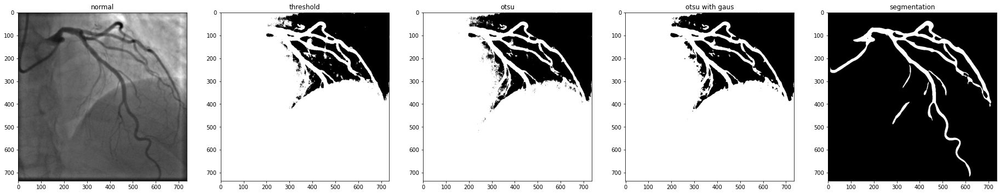

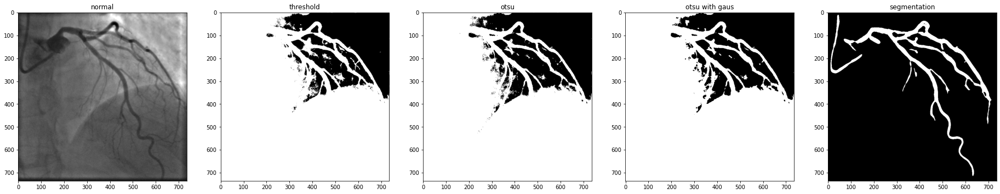

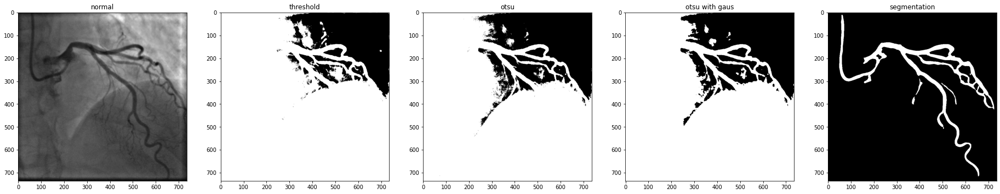

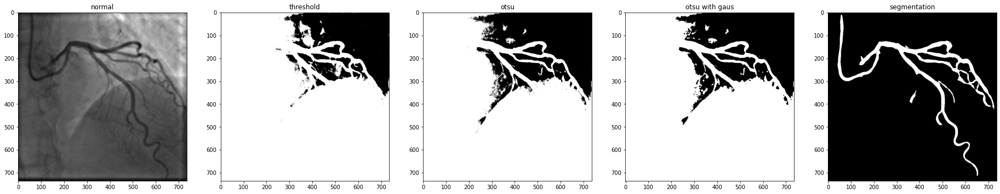

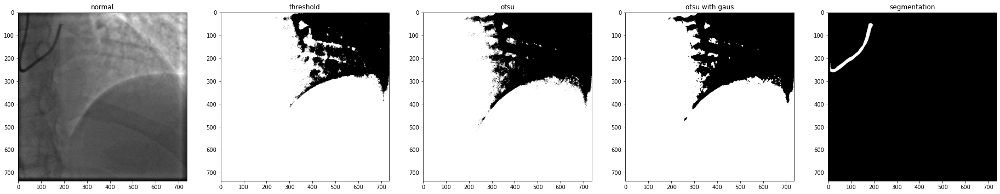

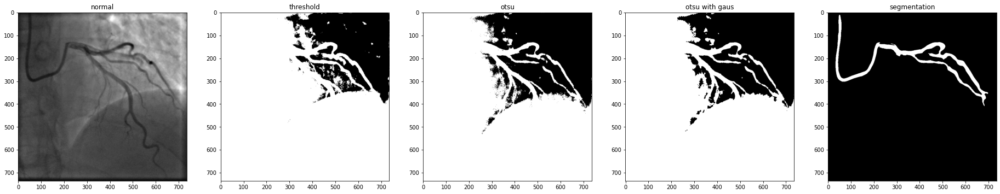

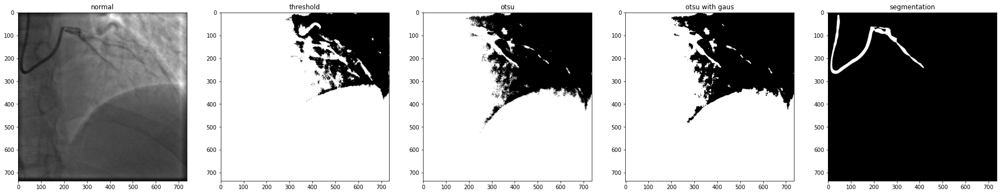

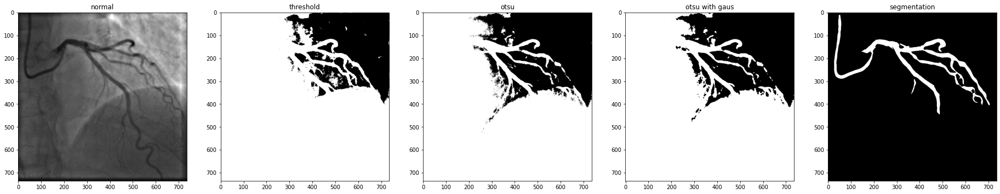

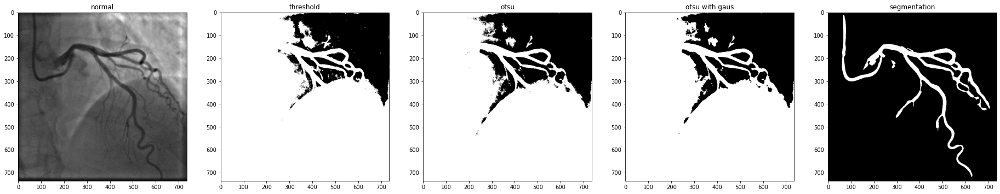

In [5]:
for i in range(len(images)):
  img = cv.imread(images[i], 0)
  seg = cv.imread(segs[i],0)

  plt.figure(figsize=(32, 8))
  plt.subplot(1, 5, 1)
  plt.title("normal")
  plt.imshow(img, "gray")
  plt.subplot(1, 5, 2)
  plt.title("threshold")
  plt.imshow(np.invert(all_threshold[i]), "gray")
  plt.subplot(1, 5, 3)
  plt.title("otsu")
  plt.imshow(np.invert(all_otsu[i]), "gray")
  plt.subplot(1, 5, 4)
  plt.title("otsu with gaus")
  plt.imshow(np.invert(all_otsuGaus[i]), "gray")
  plt.subplot(1, 5, 5)
  plt.title("segmentation")
  plt.imshow(seg, "gray")
  plt.show()


In [6]:
from sklearn.metrics import confusion_matrix


In [7]:

print(np.invert(all_threshold[0]))
print(np.invert(cv.imread(segs[0], 0).flatten()))


[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ...   0   0 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
[255 255 255 ... 255 255 255]


In [8]:
conf_t_all = [0,0,0,0]
conf_o_all = [0,0,0,0]
conf_og_all = [0,0,0,0]

for i in range(len(images)):
  pred_t =np.invert((all_threshold[i]).flatten())
  pred_o = np.invert((all_otsu[i]).flatten())
  pred_og = np.invert((all_otsuGaus[i]).flatten())
  true =cv.imread(segs[i],0).flatten()
  
  cf_t = confusion_matrix(true,pred_t)
  cf_o = confusion_matrix(true, pred_o)
  cf_og = confusion_matrix(true, pred_og)


  conf_t_all += cf_t.flatten()
  conf_o_all += cf_o.flatten()
  conf_og_all += cf_og.flatten()


In [9]:
total = 736 * 736 * len(images)

print("TN, FP, FN, TP")
print("threshold" ,conf_t_all / total)
print("otzu", conf_o_all / total)
print("otzu gaus", conf_og_all / total)


TN, FP, FN, TP
threshold [0.18998828 0.75660928 0.00097636 0.05242608]
otzu [0.24000752 0.70659004 0.00305112 0.05035132]
otzu gaus [0.23954108 0.70705648 0.00307183 0.05033061]


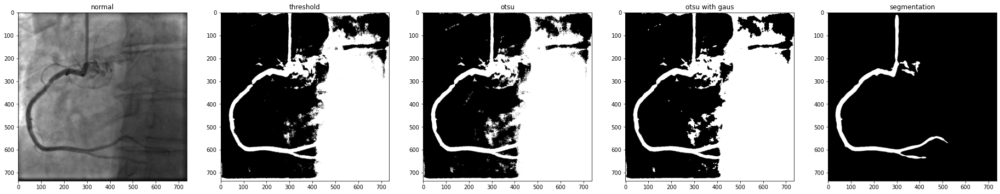

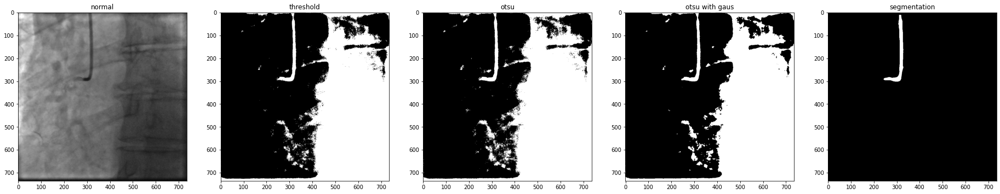

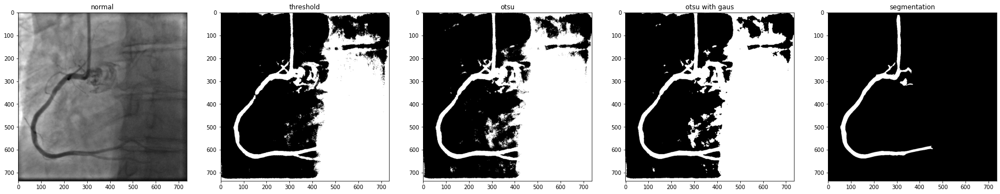

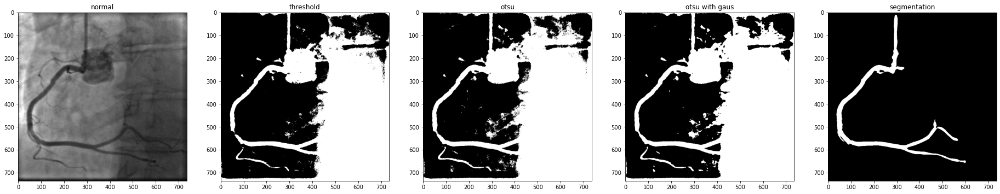

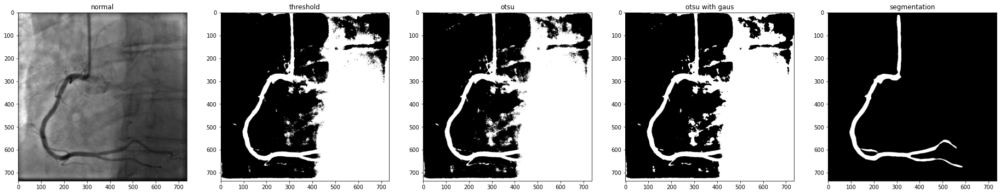

...

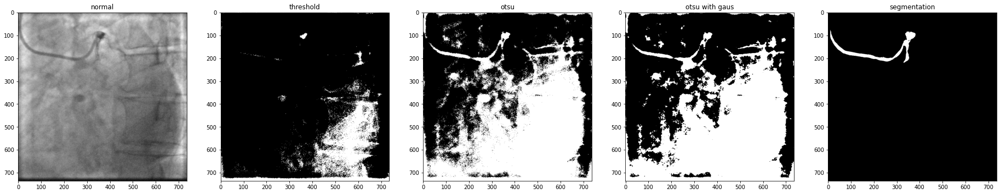

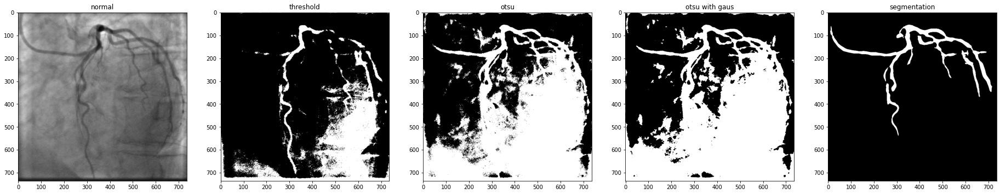

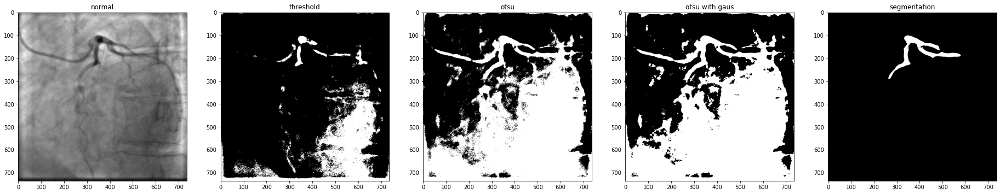

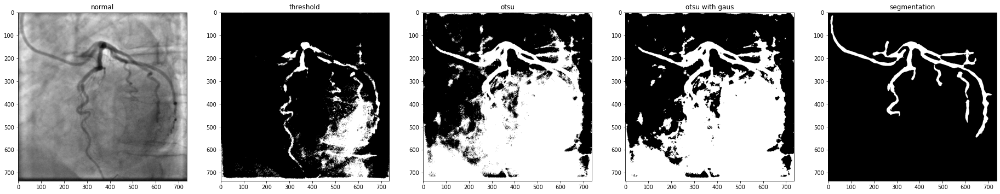

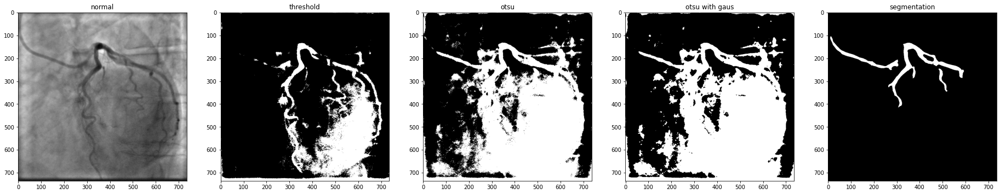

In [10]:
#create for all versions:
versions = ["0", "1", "3", "4", "6", "7", "8"]


allVersions_t = []
allVersions_o =  []
allVersions_og = []

allVersions_cft = []
allVersions_cfo = []
allVersions_cfog = []

for v in range(len(versions)):
  #get test data
  a, b, aa, bb, aaa, bbb = getData.getTestValTrainSplit(versions[v])
  images = aaa
  segs = bbb

  #get thresholds
  all_threshold = []
  all_otsu = []
  all_otsuGaus = []
  for i in range(len(images)):
    img = cv.imread(images[i], 0)
    # global thresholding
    ret1, th1 = cv.threshold(img, 95, 255, cv.THRESH_BINARY) #127
    # Otsu's thresholding
    ret2, th2 = cv.threshold(img, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
    # Otsu's thresholding after Gaussian filtering
    blur = cv.GaussianBlur(img, (5, 5), 0)
    ret3, th3 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

    all_threshold.append(th1)
    all_otsu.append(th2)
    all_otsuGaus.append(th3)
  
  #plot
  for i in range(len(images)):
    img = cv.imread(images[i], 0)
    seg = cv.imread(segs[i], 0)

    plt.figure(figsize=(32, 8))
    plt.subplot(1, 5, 1)
    plt.title("normal")
    plt.imshow(img, "gray")
    plt.subplot(1, 5, 2)
    plt.title("threshold")
    plt.imshow(np.invert(all_threshold[i]), "gray")
    plt.subplot(1, 5, 3)
    plt.title("otsu")
    plt.imshow(np.invert(all_otsu[i]), "gray")
    plt.subplot(1, 5, 4)
    plt.title("otsu with gaus")
    plt.imshow(np.invert(all_otsuGaus[i]), "gray")
    plt.subplot(1, 5, 5)
    plt.title("segmentation")
    plt.imshow(seg, "gray")
    plt.show()

  #create confusion matrix
  conf_t_all = [0, 0, 0, 0]
  conf_o_all = [0, 0, 0, 0]
  conf_og_all = [0, 0, 0, 0]

  for i in range(len(images)):
    pred_t = np.invert((all_threshold[i]).flatten())
    pred_o = np.invert((all_otsu[i]).flatten())
    pred_og = np.invert((all_otsuGaus[i]).flatten())
    true = cv.imread(segs[i], 0).flatten()

    cf_t = confusion_matrix(true, pred_t)
    cf_o = confusion_matrix(true, pred_o)
    cf_og = confusion_matrix(true, pred_og)

    conf_t_all += cf_t.flatten()
    conf_o_all += cf_o.flatten()
    conf_og_all += cf_og.flatten()
  
  allVersions_t.append(all_threshold)
  allVersions_o.append(all_otsu)
  allVersions_og.append(all_otsuGaus)

  allVersions_cft.append(conf_t_all)
  allVersions_cfo.append(conf_o_all)
  allVersions_cfog.append(conf_og_all)


In [11]:
#print(allVersions_t) 
#print(allVersions_o)
#print(allVersions_og) 

for v in range(len(versions)):
  #get test data
  a, b, aa, bb, aaa, bbb = getData.getTestValTrainSplit(versions[v])
  images = aaa
  segs = bbb
  total = 736 * 736 * len(images)

  np.set_printoptions(precision=5, suppress=True)
  print("Version:",versions[v])
  print("            TN, FP, FN, TP")
  print("threshold: " , allVersions_cft[v] / total )
  print("otzu: ", allVersions_cfo[v] / total)
  print("otzu gaus: ", allVersions_cfog[v] / total)

np.set_printoptions()


Version: 0
            TN, FP, FN, TP
threshold:  [0.5737  0.38928 0.00299 0.03403]
otzu:  [0.53901 0.42397 0.00206 0.03496]
otzu gaus:  [0.54125 0.42173 0.00214 0.03488]
Version: 1
            TN, FP, FN, TP
threshold:  [0.59061 0.3632  0.00255 0.04364]
otzu:  [0.3568  0.59701 0.00041 0.04579]
otzu gaus:  [0.35647 0.59734 0.00039 0.04581]
Version: 3
            TN, FP, FN, TP
threshold:  [0.73317 0.20433 0.01329 0.04921]
otzu:  [0.29615 0.64135 0.00171 0.06079]
otzu gaus:  [0.2892  0.6483  0.00157 0.06093]
Version: 4
            TN, FP, FN, TP
threshold:  [0.73633 0.19468 0.01227 0.05673]
otzu:  [0.39876 0.53224 0.00251 0.06648]
otzu gaus:  [0.37829 0.55271 0.00214 0.06686]
Version: 6
            TN, FP, FN, TP
threshold:  [0.54461 0.40608 0.0135  0.03581]
otzu:  [0.31012 0.64057 0.00309 0.04622]
otzu gaus:  [0.30946 0.64122 0.0031  0.04621]
Version: 7
            TN, FP, FN, TP
threshold:  [0.33846 0.60814 0.01016 0.04324]
otzu:  [0.24001 0.70659 0.00305 0.05035]
otzu gaus:  [0.23954